<h1> Image Caption Generator </h1>


<h2> Importing Libraries</h2>

In [ ]:
import numpy as np
from numpy import array
import pandas as pd
import matplotlib.pyplot as plt
%matplotlib inline
import string
import os
from PIL import Image
import glob
from pickle import dump, load
from time import time
from keras.preprocessing import sequence
from keras.models import Sequential
from keras.layers import LSTM, Embedding, TimeDistributed, Dense, RepeatVector,\
                         Activation, Flatten, Reshape, concatenate, Dropout, BatchNormalization
from keras.optimizers import Adam, RMSprop
from keras.layers import Bidirectional
from keras.layers import add
from keras.applications.inception_v3 import InceptionV3
from keras.preprocessing import image
from keras.models import Model
from keras import Input, layers
from keras import optimizers
from keras.applications.inception_v3 import preprocess_input
from keras.preprocessing.text import Tokenizer
from keras.preprocessing.sequence import pad_sequences
from keras.utils import to_categorical

**Helper Function to Load Document in memory**

In [3]:
# load doc into memory
def load_doc(filename):
	# open the file as read only
	file = open(filename, 'r')
	# read all text
	text = file.read()
	# close the file
	file.close()
	return text

filename = "/kaggle/input/dataset/Flickr8k_text/Flickr8k.token.txt"
# load descriptions
doc = load_doc(filename)
print(doc[:300])

1000268201_693b08cb0e.jpg#0	A child in a pink dress is climbing up a set of stairs in an entry way .
1000268201_693b08cb0e.jpg#1	A girl going into a wooden building .
1000268201_693b08cb0e.jpg#2	A little girl climbing into a wooden playhouse .
1000268201_693b08cb0e.jpg#3	A little girl climbing the s


In [4]:
def load_descriptions(doc):
	mapping = dict()
	# process lines
	for line in doc.split('\n'):
		# split line by white space
		tokens = line.split()
		if len(line) < 2:
			continue
		# take the first token as the image id, the rest as the description
		image_id, image_desc = tokens[0], tokens[1:]
		# extract filename from image id
		image_id = image_id.split('.')[0]
		# convert description tokens back to string
		image_desc = ' '.join(image_desc)
		# create the list if needed
		if image_id not in mapping:
			mapping[image_id] = list()
		# store description
		mapping[image_id].append(image_desc)
	return mapping

# parse descriptions
descriptions = load_descriptions(doc)
print('Loaded: %d ' % len(descriptions))

Loaded: 8092 


In [5]:
list(descriptions.keys())[:5]
descriptions['1000268201_693b08cb0e']

['A child in a pink dress is climbing up a set of stairs in an entry way .',
 'A girl going into a wooden building .',
 'A little girl climbing into a wooden playhouse .',
 'A little girl climbing the stairs to her playhouse .',
 'A little girl in a pink dress going into a wooden cabin .']

In [6]:
descriptions['1001773457_577c3a7d70']

['A black dog and a spotted dog are fighting',
 'A black dog and a tri-colored dog playing with each other on the road .',
 'A black dog and a white dog with brown spots are staring at each other in the street .',
 'Two dogs of different breeds looking at each other on the road .',
 'Two dogs on pavement moving toward each other .']

In [7]:
def clean_descriptions(descriptions):
	# prepare translation table for removing punctuation
	table = str.maketrans('', '', string.punctuation)
	for key, desc_list in descriptions.items():
		for i in range(len(desc_list)):
			desc = desc_list[i]
			# tokenize
			desc = desc.split()
			# convert to lower case
			desc = [word.lower() for word in desc]
			# remove punctuation from each token
			desc = [w.translate(table) for w in desc]
			# remove hanging 's' and 'a'
			desc = [word for word in desc if len(word)>1]
			# remove tokens with numbers in them
			desc = [word for word in desc if word.isalpha()]
			# store as string
			desc_list[i] =  ' '.join(desc)

# clean descriptions
clean_descriptions(descriptions)

In [ ]:
descriptions['1001773457_577c3a7d70']

In [8]:
# convert the loaded descriptions into a vocabulary of words
def to_vocabulary(descriptions):
	# build a list of all description strings
	all_desc = set()
	for key in descriptions.keys():
		[all_desc.update(d.split()) for d in descriptions[key]]
	return all_desc

# summarize vocabulary
vocabulary = to_vocabulary(descriptions)
print('Original Vocabulary Size: %d' % len(vocabulary))

Original Vocabulary Size: 8763


In [9]:
#  save descriptions to file, one per line
def save_descriptions(descriptions, filename):
	lines = list()
	for key, desc_list in descriptions.items():
		for desc in desc_list:
			lines.append(key + ' ' + desc)
	data = '\n'.join(lines)
	file = open(filename, 'w')
	file.write(data)
	file.close()

save_descriptions(descriptions, 'descriptions.txt')

In [50]:
# load a pre-defined list of photo identifiers
def load_set(filename):
	doc = load_doc(filename)
	dataset = list()
	# process line by line
	for line in doc.split('\n'):
		# skip empty lines
		if len(line) < 1:
			continue
		# get the image identifier
		identifier = line.split('.')[0]
		dataset.append(identifier)
	return set(dataset)

# load training dataset (6K)
filename = '/kaggle/input/dataset/Flickr8k_text/Flickr_8k.trainImages.txt'
train = load_set(filename)
print('Dataset: %d' % len(train))

Dataset: 6000


In [51]:
filename = '/kaggle/input/flikr8k/Flickr8K/Flickr8k_text/Flickr_8k.testImages.txt'
test = load_set(filename)
print('Dataset: %d' % len(test))

Dataset: 1000


In [52]:
# Below path contains all the images
images = '/kaggle/input/dataset/Flickr8k_Dataset/Flicker8k_Dataset/'
# Create a list of all image names in the directory
img = glob.glob(images + '*.jpg')
print(len(img))

8091


In [53]:
# Below file conatains the names of images to be used in train data
train_images_file = '/kaggle/input/dataset/Flickr8k_text/Flickr_8k.trainImages.txt'
# Read the train image names in a set
train_images = set(open(train_images_file, 'r').read().strip().split('\n'))

# Create a list of all the training images with their full path names
train_img = []

for i in img: # img is list of full path names of all images
    if i[len(images):] in train_images: # Check if the image belongs to training set
        train_img.append(i) # Add it to the list of train images
print(len(train_img))

6000


In [13]:
# Below file conatains the names of images to be used in test data
test_images_file = '/kaggle/input/dataset/Flickr8k_text/Flickr_8k.testImages.txt'
# Read the validation image names in a set# Read the test image names in a set
test_images = set(open(test_images_file, 'r').read().strip().split('\n'))

# Create a list of all the test images with their full path names
test_img = []

for i in img: # img is list of full path names of all images
    if i[len(images):] in test_images: # Check if the image belongs to test set
        test_img.append(i) # Add it to the list of test images
print(len(test_img))

1000


In [14]:
# load clean descriptions into memory
def load_clean_descriptions(filename, dataset):
	# load document
	doc = load_doc(filename)
	descriptions = dict()
	for line in doc.split('\n'):
		# split line by white space
		tokens = line.split()
		# split id from description
		image_id, image_desc = tokens[0], tokens[1:]
		# skip images not in the set
		if image_id in dataset:
			# create list
			if image_id not in descriptions:
				descriptions[image_id] = list()
			# wrap description in tokens
			desc = 'startseq ' + ' '.join(image_desc) + ' endseq'
			# store
			descriptions[image_id].append(desc)
	return descriptions

# descriptions
train_descriptions = load_clean_descriptions('descriptions.txt', train)
print('Descriptions: train=%d' % len(train_descriptions))

Descriptions: train=6000


In [55]:
test_descriptions = load_clean_descriptions('descriptions.txt', test)
print('Descriptions: test=%d' % len(test_descriptions))

Descriptions: test=1000


In [15]:
def preprocess(image_path):
    # Convert all the images to size 299x299 as expected by the inception v3 model
    img = image.load_img(image_path, target_size=(299, 299))
    # Convert PIL image to numpy array of 3-dimensions
    x = image.img_to_array(img)
    # Add one more dimension
    x = np.expand_dims(x, axis=0)
    # preprocess the images using preprocess_input() from inception module
    x = preprocess_input(x)
    return x

In [16]:
# Load the inception v3 model
model = InceptionV3(weights='imagenet')

96112376/96112376 [==============================] - 4s 0us/step


In [17]:
# Create a new model, by removing the last layer (output layer) from the inception v3
model_new = Model(model.input, model.layers[-2].output)

In [18]:
# Function to encode a given image into a vector of size (2048, )
def encode(image):
    image = preprocess(image) # preprocess the image
    fea_vec = model_new.predict(image) # Get the encoding vector for the image
    fea_vec = np.reshape(fea_vec, fea_vec.shape[1]) # reshape from (1, 2048) to (2048, )
    return fea_vec

In [ ]:
# Call the funtion to encode all the train images
# This will take a while on CPU - Execute this only once
start = time()
encoding_train = {}
print(len(train_img))
for img in train_img:
    encoding_train[img[len(images):]] = encode(img)
print("Time taken in seconds =", time()-start)

In [25]:
# Specify the path for the new file
import pickle
new_file_path = "/kaggle/working/train.pkl"

# Save the bottleneck train features to the new file
with open(new_file_path, "wb") as new_encoded_pickle:
    pickle.dump(encoding_train, new_encoded_pickle)

In [24]:
# Call the funtion to encode all the test images - Execute this only once
start = time()
encoding_test = {}
for img in test_img:
    encoding_test[img[len(images):]] = encode(img)
print("Time taken in seconds =", time()-start)

1/1 [==============================] - 0s 26ms/step
Time taken in seconds = 77.16353273391724


In [73]:
# Save the bottleneck test features to disk
with open("/kaggle/working/test.pkl", "wb") as encoded_pickle:
    pickle.dump(encoding_test, encoded_pickle)


In [71]:
train_features = load(open("/kaggle/working/train.pkl", "rb"))
print('Photos: train=%d' % len(train_features))

Photos: train=6000


In [99]:

test_features = load(open("/kaggle/working/test.pkl", "rb"))
print('Photos: test=%d' % len(test_features))


Photos: test=1000


In [28]:
# Create a list of all the training captions
all_train_captions = []
for key, val in train_descriptions.items():
    for cap in val:
        all_train_captions.append(cap)
len(all_train_captions)

30000

In [29]:
# Consider only words which occur at least 10 times in the corpus
word_count_threshold = 10
word_counts = {}
nsents = 0
for sent in all_train_captions:
    nsents += 1
    for w in sent.split(' '):
        word_counts[w] = word_counts.get(w, 0) + 1

vocab = [w for w in word_counts if word_counts[w] >= word_count_threshold]
print('preprocessed words %d -> %d' % (len(word_counts), len(vocab)))

preprocessed words 7578 -> 1651


In [30]:
ixtoword = {}
wordtoix = {}

ix = 1
for w in vocab:
    wordtoix[w] = ix
    ixtoword[ix] = w
    ix += 1



In [185]:
with open('wordtoix.pkl', 'wb') as pkl_file:
    pickle.dump(wordtoix, pkl_file)


In [186]:
with open('ixtoword.pkl', 'wb') as pkl_file:
    pickle.dump(ixtoword, pkl_file)


In [138]:
vocab_size = len(ixtoword) + 1 # one for appended 0's
vocab_size

1652

In [84]:
# convert a dictionary of clean descriptions to a list of descriptions
def to_lines(descriptions):
	all_desc = list()
	for key in descriptions.keys():
		[all_desc.append(d) for d in descriptions[key]]
	return all_desc

# calculate the length of the description with the most words
def Max_length(descriptions):
	lines = to_lines(descriptions)
	return max(len(d.split()) for d in lines)

# determine the maximum sequence length
max_length = Max_length(train_descriptions)
print('Description Length: %d' % max_length)

Description Length: 34


In [131]:
# data generator, intended to be used in a call to model.fit_generator()
def data_generator(descriptions, photos, wordtoix, max_length, num_photos_per_batch):
    X1, X2, y = list(), list(), list()
    n=0
    # loop for ever over images
    while 1:
        for key, desc_list in descriptions.items():
            n+=1
            # retrieve the photo feature
            photo = photos[key+'.jpg']
            for desc in desc_list:
                # encode the sequence
                seq = [wordtoix[word] for word in desc.split(' ') if word in wordtoix]
                # split one sequence into multiple X, y pairs
                for i in range(1, len(seq)):
                    # split into input and output pair
                    in_seq, out_seq = seq[:i], seq[i]
                    # pad input sequence
                    in_seq = pad_sequences([in_seq], maxlen=max_length)[0]
                    # encode output sequence
                    out_seq = to_categorical([out_seq], num_classes=vocab_size)[0]
                    # store
                    X1.append(photo)
                    X2.append(in_seq)
                    y.append(out_seq)
            # yield the batch data
            if n==num_photos_per_batch:
                yield [[array(X1), array(X2)], array(y)]
                X1, X2, y = list(), list(), list()
                n=0

In [35]:
# Load Glove vectors
glove_dir = '/kaggle/input/glovevector'
embeddings_index = {} # empty dictionary
f = open(os.path.join(glove_dir, 'glove.6B.200d.txt'), encoding="utf-8")

for line in f:
    values = line.split()
    word = values[0]
    coefs = np.asarray(values[1:], dtype='float32')
    embeddings_index[word] = coefs
f.close()
print('Found %s word vectors.' % len(embeddings_index))

Found 400000 word vectors.


In [142]:
embedding_dim = 200

# Get 200-dim dense vector for each of the 10000 words in out vocabulary
embedding_matrix = np.zeros((vocab_size, embedding_dim))

for word, i in wordtoix.items():
    #if i < max_words:
    embedding_vector = embeddings_index.get(word)
    if embedding_vector is not None:
        # Words not found in the embedding index will be all zeros
        embedding_matrix[i] = embedding_vector
embedding_matrix.shape

(1652, 200)

In [143]:
inputs1 = Input(shape=(2048,))
fe1 = Dropout(0.5)(inputs1)
fe2 = Dense(256, activation='relu')(fe1)
inputs2 = Input(shape=(max_length,))
se1 = Embedding(vocab_size, embedding_dim, mask_zero=True)(inputs2)
se2 = Dropout(0.5)(se1)
se3 = LSTM(256)(se2)
decoder1 = add([fe2, se3])
decoder2 = Dense(256, activation='relu')(decoder1)
outputs = Dense(vocab_size, activation='softmax')(decoder2)
model = Model(inputs=[inputs1, inputs2], outputs=outputs)
model.summary()

Model: "model_3"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_7 (InputLayer)        [(None, 34)]                 0         []                            
                                                                                                  
 input_6 (InputLayer)        [(None, 2048)]               0         []                            
                                                                                                  
 embedding_2 (Embedding)     (None, 34, 200)              330400    ['input_7[0][0]']             
                                                                                                  
 dropout_4 (Dropout)         (None, 2048)                 0         ['input_6[0][0]']             
                                                                                            

In [144]:
model.layers[2]




In [145]:
model.layers[2].set_weights([embedding_matrix])
model.layers[2].trainable = False

In [146]:
model.compile(loss='categorical_crossentropy', optimizer='adam')

In [178]:
epochs = 10
number_pics_per_bath = 3
steps = len(train_descriptions)//number_pics_per_bath


In [179]:
for i in range(epochs):
    generator = data_generator(train_descriptions, train_features, wordtoix, max_length, number_pics_per_bath)
    model.fit_generator(generator, epochs=1, steps_per_epoch=steps, verbose=1)
    model.save('./model_weights/model_' + str(i) + '.h5')

/tmp/ipykernel_47/2332540905.py:3: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  model.fit_generator(generator, epochs=1, steps_per_epoch=steps, verbose=1)


2000/2000 [==============================] - 155s 77ms/step - loss: 2.7148


In [180]:
from nltk.translate.bleu_score import corpus_bleu

def generate_desc(model, photo, max_length, wordtoix):
    in_text = 'startseq'
    for _ in range(max_length):
        
        sequence = [wordtoix[w] for w in in_text.split() if w in wordtoix]
        sequence = pad_sequences([sequence], maxlen=max_length)
        yhat = model.predict([photo,sequence], verbose=0)
        yhat = np.argmax(yhat)
        word = word_for_id(yhat, wordtoix)
        if word is None:
            break
        in_text += ' ' + word
        if word == 'endseq':
            break
    return in_text

def evaluate_model(model, descriptions, photos, wordtoix, max_length):
    actual, predicted = list(), list()
    for key, desc_list in descriptions.items():
#         pic = list(encoding_test.keys())[key+'.jpg']
        image = encoding_test[key+'.jpg'].reshape((1,2048)) 
        yhat = generate_desc(model, image, max_length, wordtoix)
        references = [d.split() for d in desc_list]
        actual.append(references)
        predicted.append(yhat.split())
    # calculate BLEU score
    print('BLEU-1: %f' % corpus_bleu(actual, predicted, weights=(1.0, 0, 0, 0)))
    print('BLEU-2: %f' % corpus_bleu(actual, predicted, weights=(0.5, 0.5, 0, 0)))
    print('BLEU-3: %f' % corpus_bleu(actual, predicted, weights=(0.3, 0.3, 0.3, 0)))
    print('BLEU-4: %f' % corpus_bleu(actual, predicted, weights=(0.25, 0.25, 0.25, 0.25)))
    bleu_score = corpus_bleu(actual, predicted)
    return bleu_score


with open("/kaggle/working/test.pkl", "rb") as encoded_pickle:
    test_features = pickle.load(encoded_pickle)


print(len(test_descriptions))
print(len(test_features))
# Evaluate the model using BLEU score
bleu_score = evaluate_model(model, test_descriptions, test_features, wordtoix, max_length)
print('BLEU Score: %.2f' % (bleu_score * 100))

1000
1000
BLEU-1: 0.602861
BLEU-2: 0.377829
BLEU-3: 0.280566
BLEU-4: 0.151188
BLEU Score: 15.12


In [163]:
from nltk.translate.bleu_score import corpus_bleu

def generate_desc(model, photo, max_length, wordtoix):
    in_text = 'startseq'
    for _ in range(max_length):
        
        sequence = [wordtoix[w] for w in in_text.split() if w in wordtoix]
        sequence = pad_sequences([sequence], maxlen=max_length)
        yhat = model.predict([photo,sequence], verbose=0)
        yhat = np.argmax(yhat)
        word = word_for_id(yhat, wordtoix)
        if word is None:
            break
        in_text += ' ' + word
        if word == 'endseq':
            break
    return in_text

def evaluate_model(model, descriptions, photos, wordtoix, max_length):
    actual, predicted = list(), list()
    for key, desc_list in descriptions.items():
#         pic = list(encoding_test.keys())[key+'.jpg']
        image = encoding_test[key+'.jpg'].reshape((1,2048)) 
        yhat = generate_desc(model, image, max_length, wordtoix)
        references = [d.split() for d in desc_list]
        actual.append(references)
        predicted.append(yhat.split())
    # calculate BLEU score
    print('BLEU-1: %f' % corpus_bleu(actual, predicted, weights=(1.0, 0, 0, 0)))
    print('BLEU-2: %f' % corpus_bleu(actual, predicted, weights=(0.5, 0.5, 0, 0)))
    print('BLEU-3: %f' % corpus_bleu(actual, predicted, weights=(0.3, 0.3, 0.3, 0)))
    print('BLEU-4: %f' % corpus_bleu(actual, predicted, weights=(0.25, 0.25, 0.25, 0.25)))
    bleu_score = corpus_bleu(actual, predicted)
    return bleu_score


with open("/kaggle/working/test.pkl", "rb") as encoded_pickle:
    test_features = pickle.load(encoded_pickle)


print(len(test_descriptions))
print(len(test_features))
# Evaluate the model using BLEU score
bleu_score = evaluate_model(model, test_descriptions, test_features, wordtoix, max_length)
print('BLEU Score: %.2f' % (bleu_score * 100))

1000
1000
BLEU-1: 0.607508
BLEU-2: 0.380998
BLEU-3: 0.282032
BLEU-4: 0.150898
BLEU Score: 15.09


In [125]:
def word_for_id(integer, tokenizer):
    for word, index in wordtoix.items():
        if index == integer:
            return word
    return None

In [155]:
for i in range(epochs):
    generator = data_generator(train_descriptions, train_features, wordtoix, max_length, number_pics_per_bath)
    model.fit_generator(generator, epochs=1, steps_per_epoch=steps, verbose=1)
    model.save('./model_weights/model_' + str(i) + '.h5')

   1/1000 [..............................] - ETA: 1:32 - loss: 3.3406

/tmp/ipykernel_47/2332540905.py:3: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  model.fit_generator(generator, epochs=1, steps_per_epoch=steps, verbose=1)


1000/1000 [==============================] - 81s 81ms/step - loss: 3.3267


/opt/conda/lib/python3.10/site-packages/keras/src/engine/training.py:3000: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


1000/1000 [==============================] - 81s 81ms/step - loss: 3.0465


In [162]:
from keras.models import load_model
model = load_model('/kaggle/working/model_weights/model_9.h5')

In [148]:
model.optimizer.lr = 0.0001
epochs = 10
number_pics_per_bath = 6
steps = len(train_descriptions)//number_pics_per_bath
for i in range(epochs):
    generator = data_generator(train_descriptions, train_features, wordtoix, max_length, number_pics_per_bath)
    model.fit_generator(generator, epochs=1, steps_per_epoch=steps, verbose=1)
    #model.save('./model_weights/model_' + str(i) + '.h5')

/tmp/ipykernel_47/2838963978.py:7: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  model.fit_generator(generator, epochs=1, steps_per_epoch=steps, verbose=1)


1000/1000 [==============================] - 82s 82ms/step - loss: 3.3743


In [165]:
model.save_weights('./model_weights/model_30.h5')


In [166]:
model.load_weights('./model_weights/model_30.h5')

In [164]:
images = '/kaggle/input/dataset/Flickr8k_Dataset/Flicker8k_Dataset/'


In [167]:
with open("/kaggle/working/test.pkl", "rb") as encoded_pickle:
    encoding_test = load(encoded_pickle)

In [168]:
def greedySearch(photo):
    in_text = 'startseq'
    for i in range(max_length):
        sequence = [wordtoix[w] for w in in_text.split() if w in wordtoix]
        sequence = pad_sequences([sequence], maxlen=max_length)
        yhat = model.predict([photo,sequence], verbose=0)
        yhat = np.argmax(yhat)
        word = ixtoword[yhat]
        in_text += ' ' + word
        if word == 'endseq':
            break
    final = in_text.split()
    final = final[1:-1]
    final = ' '.join(final)
    return final

In [174]:
def beamSearch(photo, beam_width=3):
    start = [wordtoix["startseq"]]
    start_word = [[start, 0.0]]

    while len(start_word[0][0]) < max_length:
        temp = []
        for s in start_word:
            sequence = pad_sequences([s[0]], maxlen=max_length)
            preds = model.predict([photo, sequence], verbose=0)
            word_preds = np.argsort(preds[0])[-beam_width:]

            for w in word_preds:
                next_cap, prob = s[0][:], s[1]
                next_cap.append(w)
                prob += preds[0][w]
                temp.append([next_cap, prob])

        start_word = temp
        start_word = sorted(start_word, reverse=False, key=lambda l: l[1])
        start_word = start_word[-beam_width:]

    start_word = start_word[-1][0]
    intermediate_caption = [ixtoword[i] for i in start_word]

    final_caption = []
    for i in intermediate_caption:
        if i != "endseq":
            final_caption.append(i)
        else:
            break

    final_caption = " ".join(final_caption[1:])
    return final_caption


In [187]:
z=1
pic = list(encoding_test.keys())[z]
image = encoding_test[pic]
image

array([0.16970816, 0.7547889 , 0.4917934 , ..., 0.3672235 , 0.06033132,
       0.72441006], dtype=float32)

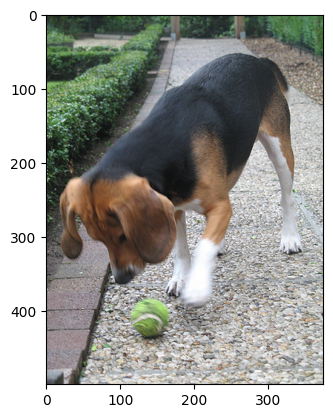

Greedy: brown and white dog playing with tennis ball in its mouth


In [176]:
z=1
pic = list(encoding_test.keys())[z]
image = encoding_test[pic].reshape((1,2048))
x=plt.imread(images+pic)
plt.imshow(x)
plt.show()
print("Greedy:",beamSearch(image))

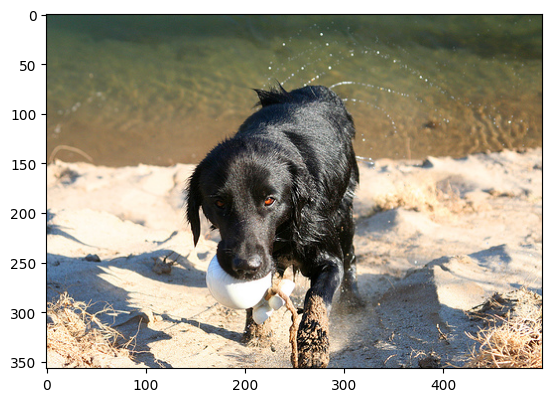

Greedy Caption for 280706862_14c30d734a.jpg: black dog swims in the water


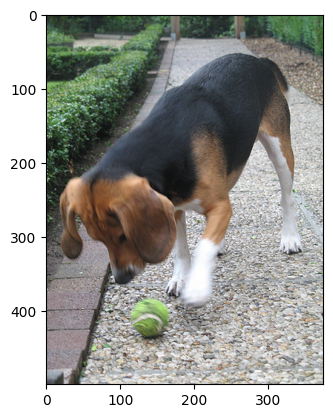

Greedy Caption for 929679367_ff8c7df2ee.jpg: brown and white dog playing with tennis ball in its mouth


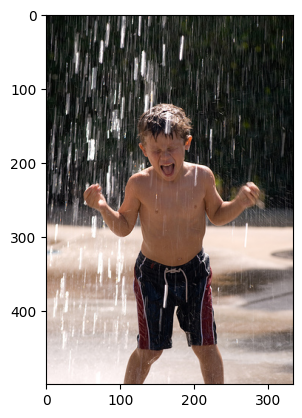

Greedy Caption for 1317292658_ba29330a0b.jpg: young boy is splashing through water


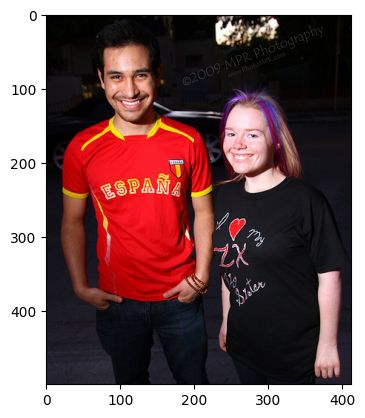

Greedy Caption for 3411393875_a9ff73c67a.jpg: two young girls are posing for picture


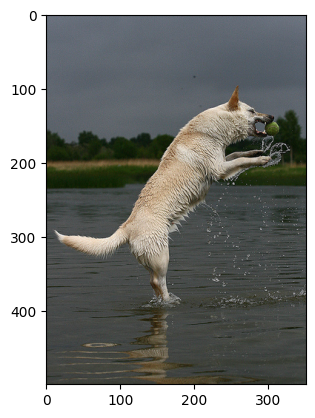

Greedy Caption for 3619416477_9d18580a14.jpg: white dog runs through the water


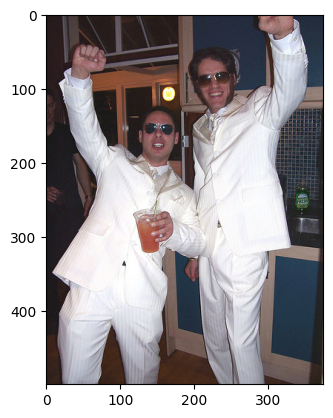

Greedy Caption for 506738508_327efdf9c3.jpg: man in white shirt and brown hair stands in front of crowd


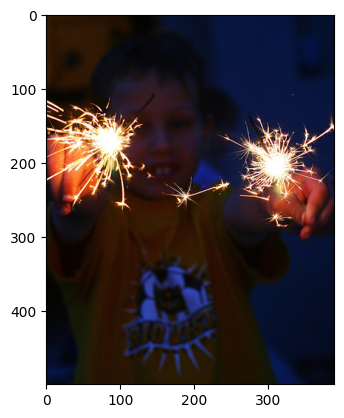

Greedy Caption for 747921928_48eb02aab2.jpg: two people are sitting on the top of wooden


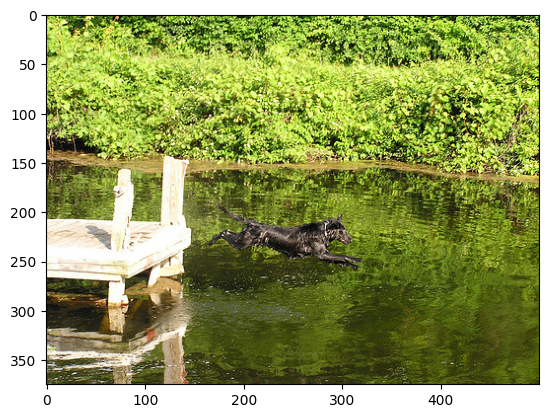

Greedy Caption for 2607462776_78e639d891.jpg: two dogs play in water


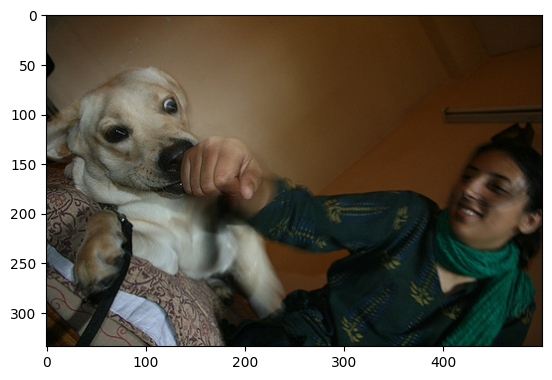

Greedy Caption for 757332692_6866ae545c.jpg: white dog is playing with white dog


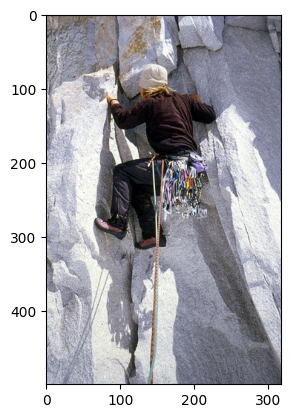

Greedy Caption for 486917990_72bd4069af.jpg: man in blue shirt and hat stands on the sidewalk


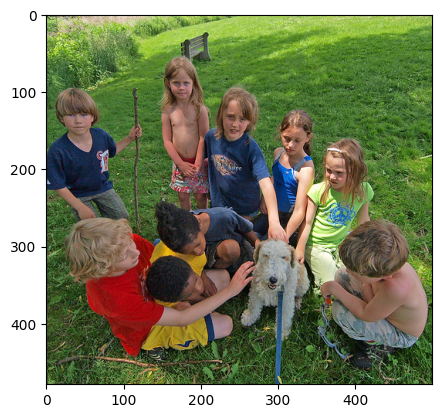

Greedy Caption for 3605061440_1d08c80a57.jpg: two boys are playing in the grass


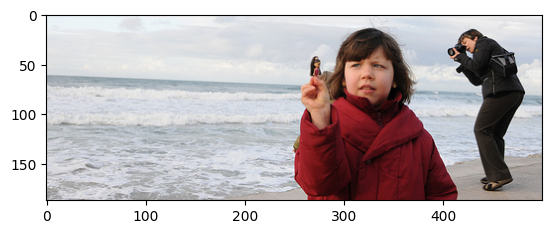

Greedy Caption for 2393264648_a280744f97.jpg: two young girls are sitting on the beach looking at sunset


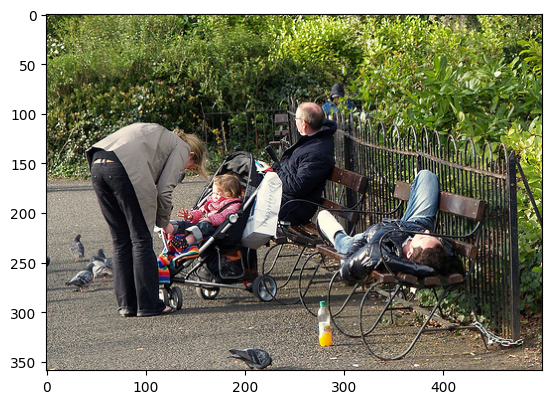

Greedy Caption for 3471841031_a949645ba8.jpg: two people are sitting on bench in front of an intersection


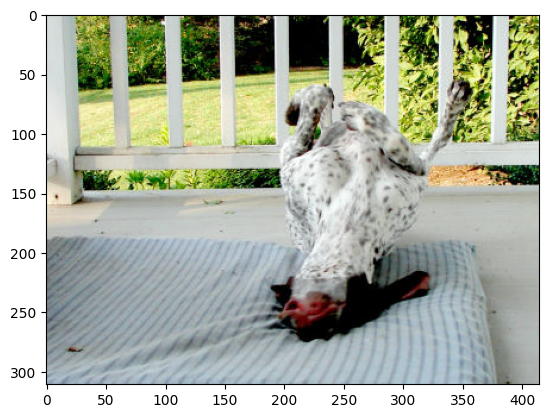

Greedy Caption for 2847615962_c330bded6e.jpg: black and white dog jumping over fence


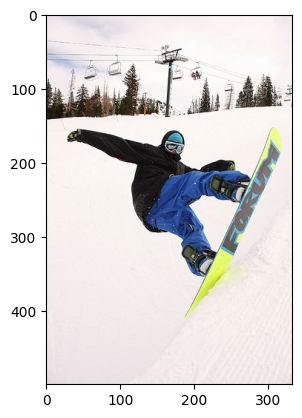

Greedy Caption for 3182121297_38c99b2769.jpg: man in red jacket and blue jacket is skiing


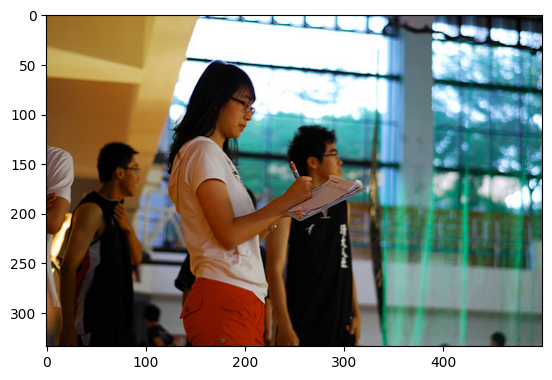

Greedy Caption for 3497224764_6e17544e0d.jpg: group of people are walking down the street


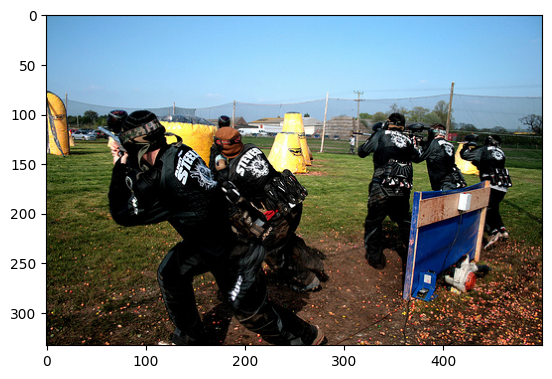

Greedy Caption for 3473264983_67917a931f.jpg: group of people are standing in front of crowd


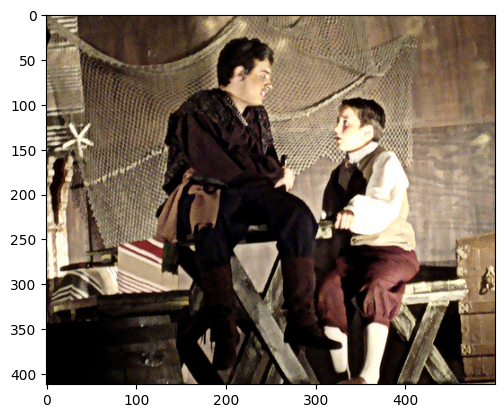

Greedy Caption for 3694064560_467683205b.jpg: man is sitting on wooden bench


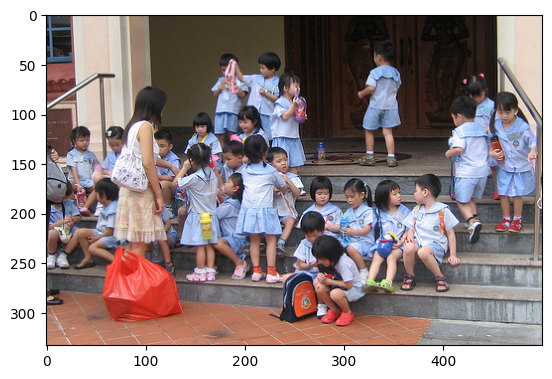

Greedy Caption for 2228022180_9597b2a458.jpg: group of children are sitting on an outdoor court


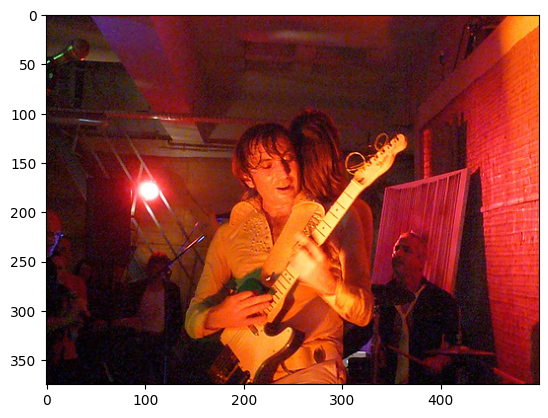

Greedy Caption for 3592968286_b63c81bcd2.jpg: man plays guitar


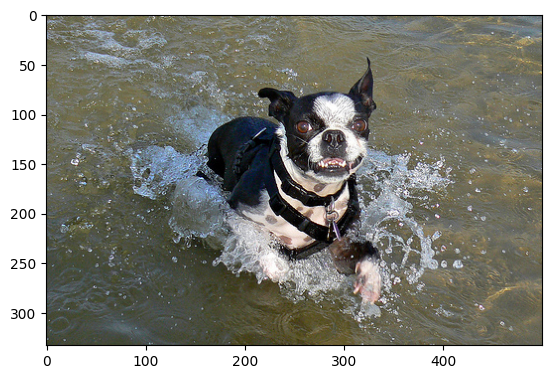

Greedy Caption for 1772859261_236c09b861.jpg: black and white dog swims through the water


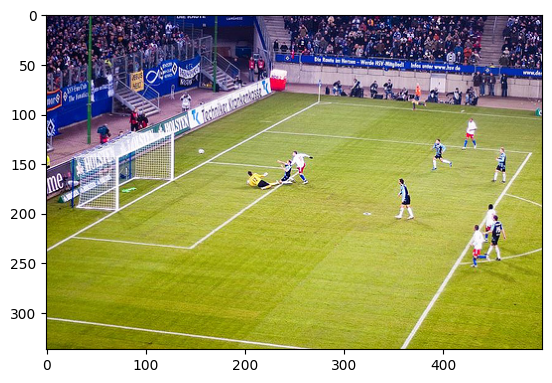

Greedy Caption for 3232470286_903a61ea16.jpg: two men are playing soccer


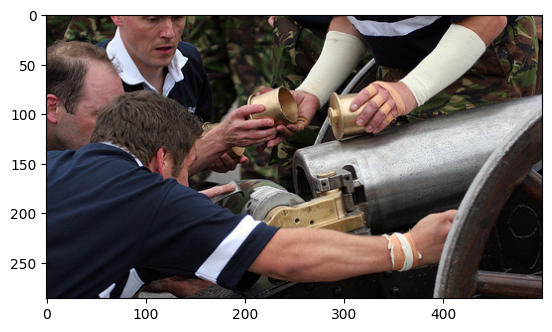

Greedy Caption for 3504881781_6a842e043b.jpg: group of people are standing in front of building


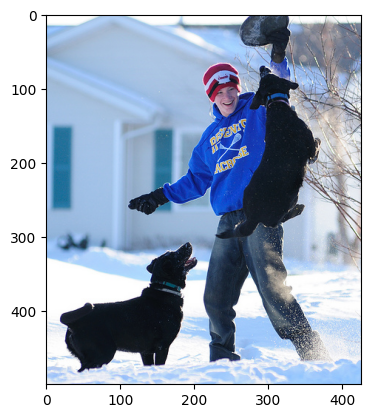

Greedy Caption for 3223055565_68973f5d20.jpg: black dog is running in the snow


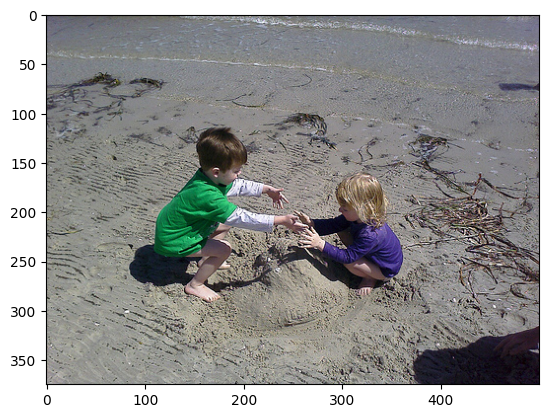

Greedy Caption for 2194286203_5dc620006a.jpg: young boy wearing pink shirt is sitting on the beach near the beach


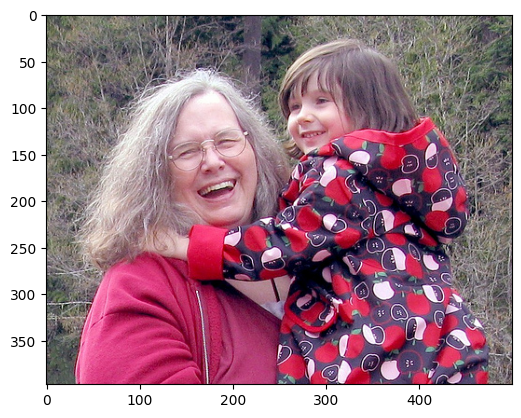

Greedy Caption for 3457045393_2bbbb4e941.jpg: two young girls are standing in front of an adult


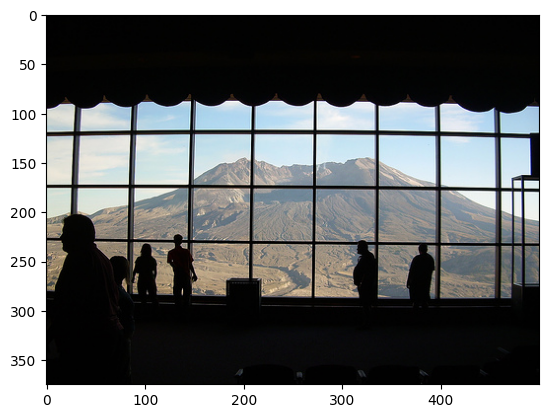

Greedy Caption for 470373679_98dceb19e7.jpg: two people are sitting on the edge of wooden


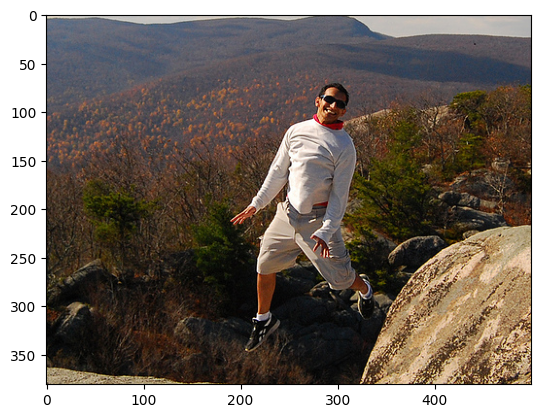

Greedy Caption for 3016606751_0e8be20abd.jpg: man is standing on rock overlooking the ocean


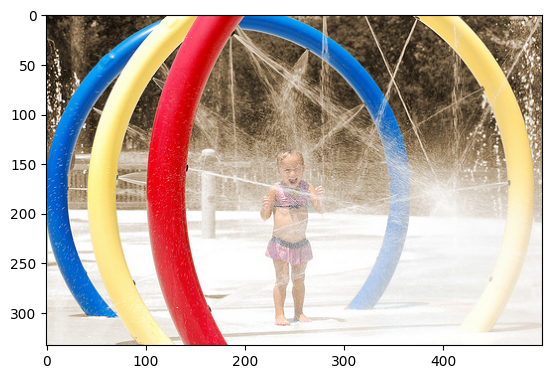

Greedy Caption for 3657016761_d553e514d9.jpg: little girl in pink hat is standing on the sidewalk


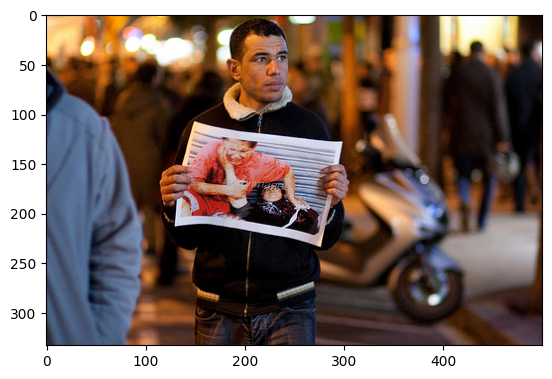

Greedy Caption for 3186073578_6e115f45f5.jpg: man in white shirt and white shirt is standing in front of crowd


In [177]:
for z in range(30):
    pic = list(encoding_test.keys())[z]
    image = encoding_test[pic].reshape((1, 2048))
    
    x = plt.imread(images + pic)
    plt.imshow(x)
    plt.show()
    
    caption = beamSearch(image)
    print(f"Greedy Caption for {pic}: {caption}")

<h1> New Code </h1>